In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tensorflow.keras.layers as layers
import tensorflow.keras.optimizers as optimizers
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import LambdaCallback, ModelCheckpoint, ReduceLROnPlateau
import seaborn as sns
from PIL import Image
from skimage.transform import resize

import threading, random, os

In [2]:
imgs = np.load('dataset/imgs_uint8.npy').astype(np.float32) / 255.
labels = np.load('dataset/labels_uint8.npy').astype(np.float32) / 255.
waldo_sub_imgs = np.load('dataset/waldo_sub_imgs_uint8.npy',allow_pickle=True) / 255.
waldo_sub_labels = np.load('dataset/waldo_sub_labels_uint8.npy',allow_pickle=True) / 255.

print(imgs.shape, labels.shape)
print(waldo_sub_imgs.shape, waldo_sub_labels.shape)

(18, 1760, 2800, 3) (18, 1760, 2800)
(18,) (18,)


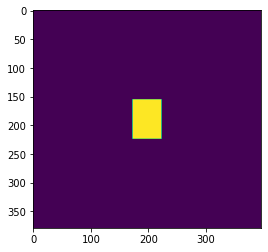

In [3]:
for img in waldo_sub_labels:
    plt.imshow(img)
    break


In [4]:
class Dataset:
    def __init__(self, x, y, out_sz=(224,224), waldo = True):
        self.x = x
        self.y = y
        self.out_sz = out_sz
        self.waldo = waldo
    
    def img_resize(self,img):
        return img.resize(self.out_sz)
        
    def img_ramdom_crop(self,x1,y1,waldo):
        dataset_x = []
        dataset_y = []
            
        for i in range(1000):
            np.random.seed(i)
            left = np.random.randint(0,x1.shape[0] - self.out_sz[0])
            right = left + self.out_sz[0]
            np.random.seed(i+5)
            up = np.random.randint(0,x1.shape[1] - self.out_sz[1])
            down = up + self.out_sz[1]

            # ex. crop(left,up, right, down)
            area = (left, up, right, down)

            img_x1 = x1[left:right,up:down]
            img_y1 = y1[left:right,up:down]

            if waldo==False:
                if 1 in img_y1:
                    continue
                dataset_x.append(img_x1)
                dataset_y.append(img_y1)
            else:
                if 1 in img_y1:
                    dataset_x.append(img_x1)
                    dataset_y.append(img_y1)
                else:
                    continue
        return dataset_x, dataset_y        
            
        
    def generate_data(self):
        self.dataset_x = []
        self.dataset_y = []
        
        for x1, y1 in zip(self.x, self.y):
            result_x, result_y = self.img_ramdom_crop(x1,y1, self.waldo)
            self.dataset_x.extend(result_x)
            self.dataset_y.extend(result_y)
        return self.dataset_x, self.dataset_y
        

In [5]:
not_waldo = Dataset(imgs, labels, waldo=False)
not_waldo_x, not_waldo_y = not_waldo.generate_data()

waldo = Dataset(waldo_sub_imgs, waldo_sub_labels)
waldo_x, waldo_y = waldo.generate_data()

In [6]:
final_x = not_waldo_x + waldo_x
final_y = not_waldo_y + waldo_y

np.random.seed(0)
np.random.shuffle(final_x)
np.random.seed(0)
np.random.shuffle(final_y)


In [7]:
def __next__(idx, x,y, batch_size, last_idx):
   
    out_x = x[idx:idx+batch_size]
    out_y = y[idx:idx+batch_size]
    
    final_out_y = []
    
    for y_hat in out_y:
        y_hat = np.array(y_hat)
        y_hat = to_categorical(y_hat, num_classes=2).reshape((y_hat.shape[0] * y_hat.shape[1], 2))
        final_out_y.append(y_hat)
    
    idx = idx + batch_size
    
    if idx > last_idx:
        idx = 0
    return idx, np.array(out_x), np.array(final_out_y)
    
    
def generate_data(final_x, final_y, batch_size = 4):
    idx = 0
    last_idx = len(final_x) - 1
    
    while True:
        idx, out_x, out_y = __next__(idx, final_x, final_y, batch_size, last_idx)
        yield out_x, out_y

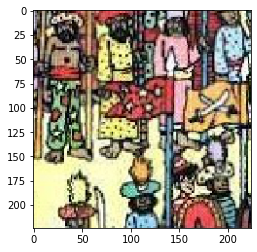

In [8]:
plt.imshow(final_x[13])

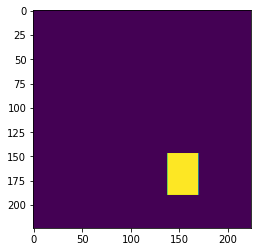

In [9]:
plt.imshow(final_y[13])

In [10]:
print(len(not_waldo_x), len(waldo_x))

17692 18000


In [11]:
inputs = layers.Input(shape=(224, 224, 3))

net = layers.Conv2D(64, kernel_size=3, padding='same')(inputs)
# net = layers.Activation('relu')(net)
net = layers.LeakyReLU()(net)
net = layers.MaxPool2D(pool_size=2)(net)

shortcut_1 = net

net = layers.Conv2D(128, kernel_size=3, padding='same')(net)
# net = layers.Activation('relu')(net)
net = layers.LeakyReLU()(net)
net = layers.MaxPool2D(pool_size=2)(net)

shortcut_2 = net

net = layers.Conv2D(256, kernel_size=3, padding='same')(net)
# net = layers.Activation('relu')(net)
net = layers.LeakyReLU()(net)
net = layers.MaxPool2D(pool_size=2)(net)

shortcut_3 = net

net = layers.Conv2D(256, kernel_size=1, padding='same')(net)
# net = layers.Activation('relu')(net)
net = layers.LeakyReLU()(net)
net = layers.MaxPool2D(pool_size=2)(net)

net = layers.UpSampling2D(size=2)(net)
net = layers.Conv2D(256, kernel_size=3, padding='same')(net)
net = layers.Activation('relu')(net)

net = layers.Add()([net, shortcut_3])

net = layers.UpSampling2D(size=2)(net)
net = layers.Conv2D(128, kernel_size=3, padding='same')(net)
net = layers.Activation('relu')(net)

net = layers.Add()([net, shortcut_2])

net = layers.UpSampling2D(size=2)(net)
net = layers.Conv2D(64, kernel_size=3, padding='same')(net)
net = layers.Activation('relu')(net)

net = layers.Add()([net, shortcut_1])

net = layers.UpSampling2D(size=2)(net)
net = layers.Conv2D(2, kernel_size=1, padding='same')(net)

net = layers.Reshape((-1, 2))(net)
net = layers.Activation('softmax')(net)

model = Model(inputs=inputs, outputs=net)

model.compile(
    loss='categorical_crossentropy', 
    optimizer=optimizers.Adam(), 
    metrics=['acc']
)

model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 224, 224, 64) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 112, 112, 64) 0           leaky_re_l

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
 Epoch:  397 - loss: 0.0054 - acc: 0.9979
Epoch 00398: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
 Epoch:  499 - loss: 0.0021 - acc: 0.9991

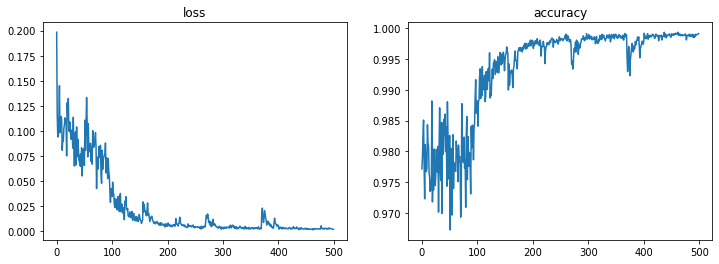

In [12]:
gen_mix = generate_data(final_x, final_y,  batch_size = 6)

def on_epoch_end(epoch, logs):
    print('\r', 'Epoch:%5d - loss: %.4f - acc: %.4f' % (epoch, logs['loss'], logs['acc']), end='')

print_callback = LambdaCallback(on_epoch_end=on_epoch_end)

history = model.fit_generator(
    gen_mix, steps_per_epoch=6, epochs=500, 
    verbose=0,
    callbacks=[
        print_callback,
        ReduceLROnPlateau(monitor='loss', factor=0.2, patience=100, verbose=1, mode='auto', min_lr=1e-05)
    ]
)

model.save('model_201228.h5')

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.title('loss')
plt.plot(history.history['loss'])
plt.subplot(1, 2, 2)
plt.title('accuracy')
plt.plot(history.history['acc'])

In [13]:
def img_crop(x1):
    dataset_x = []
    #print(x1.shape)
    
    for row in range(0,len(x1),224):
        for col in range(0, len(x1[0]), 224):
            left = row
            right = left + 224
            up = col
            down = up + 224

            # ex. crop(left,up, right, down)
            area = (left, up, right, down)

            img_x1 = x1[left:right,up:down]
            dataset_x.append(img_x1)

    return np.array(dataset_x)  

In [14]:
def bbox_from_mask(img):
    rows = np.any(img, axis=1)
    cols = np.any(img, axis=0)
    y1, y2 = np.where(rows)[0][[0, -1]]
    x1, x2 = np.where(cols)[0][[0, -1]]
    return x1, y1, x2, y2



In [15]:
def make_overlay(data):
    try:
        x1, y1, x2, y2 = bbox_from_mask((data > 0.8).astype(np.uint8))
        #print(x1, y1, x2, y2)

        # make overlay
        overlay = np.repeat(np.expand_dims(np.zeros_like(data, dtype=np.uint8), axis=-1), 3, axis=-1)
        alpha = np.expand_dims(np.full_like(data, 255, dtype=np.uint8), axis=-1)

        overlay = np.concatenate([overlay, alpha], axis=-1)

        overlay[y1:y2, x1:x2, 3] = 0
        return overlay, (x1, y1, x2, y2)
    except:
        # make overlay
        overlay = np.repeat(np.expand_dims(np.zeros_like(data, dtype=np.uint8), axis=-1), 3, axis=-1)
        alpha = np.expand_dims(np.full_like(data, 255, dtype=np.uint8), axis=-1)

        overlay = np.concatenate([overlay, alpha], axis=-1)
        return overlay, None
        

def img_combine(pred_img):
    idx = 0
    final_data = []
    overlay_list = []
    rectangle_list = []
    
    for i in range(8):
        data = []
        overlay_ = []
        for j in range(13):
            if data == []:
                data = pred_img[idx]
                overlay_, rectangle = make_overlay(pred_img[idx])
            else: 
                data = np.concatenate((data, pred_img[idx]), axis=1)
                overlay__, rectangle =  make_overlay(pred_img[idx])
                overlay_ = np.concatenate((overlay_, overlay__), axis=1)
            
            if rectangle is not None:
                rectangle_list.append((rectangle[0] + j * 224, rectangle[1] + i * 224, rectangle[2] + j * 224,rectangle[3] + i * 224))
            idx += 1
            
        if final_data ==[]:
            final_data = data
            overlay_list = overlay_
        else:
            final_data = np.concatenate((final_data, data), axis=0)
            overlay_list = np.concatenate((overlay_list, overlay_), axis=0)
    return final_data, overlay_list, rectangle_list

In [25]:
model = load_model('model_201228.h5')

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


(1792, 2912, 3)


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:45: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


(1792, 2912, 3)
(1792, 2912, 3)
(1792, 2912, 3)
(1792, 2912, 3)
(1792, 2912, 3)
(1792, 2912, 3)
(1792, 2912, 3)
(1792, 2912, 3)


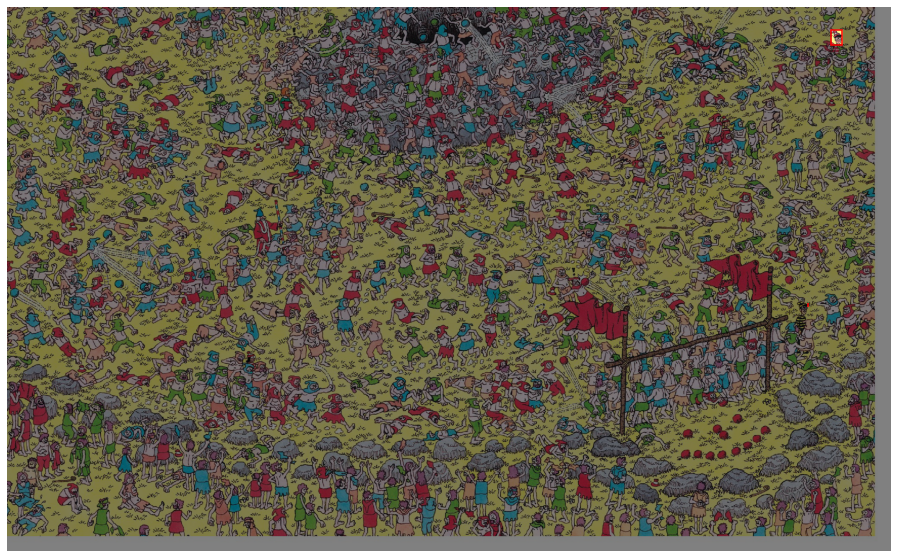

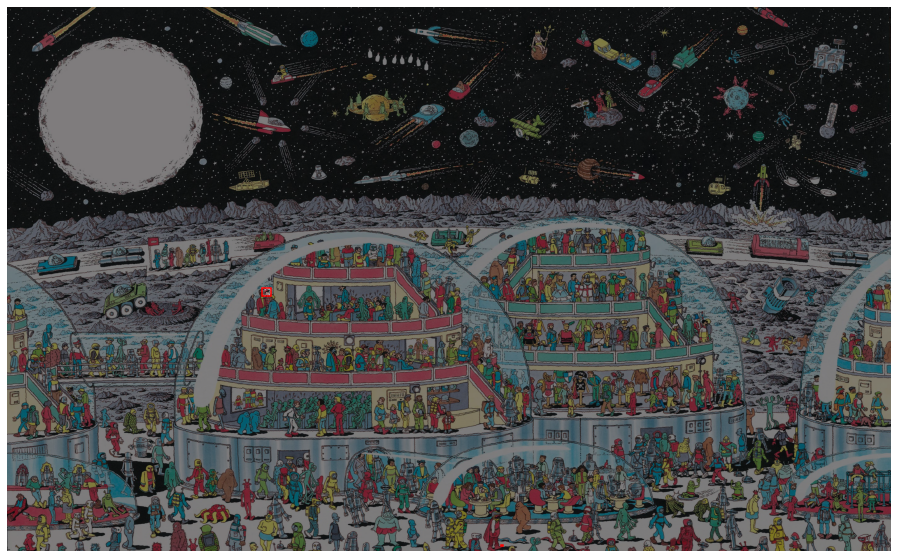

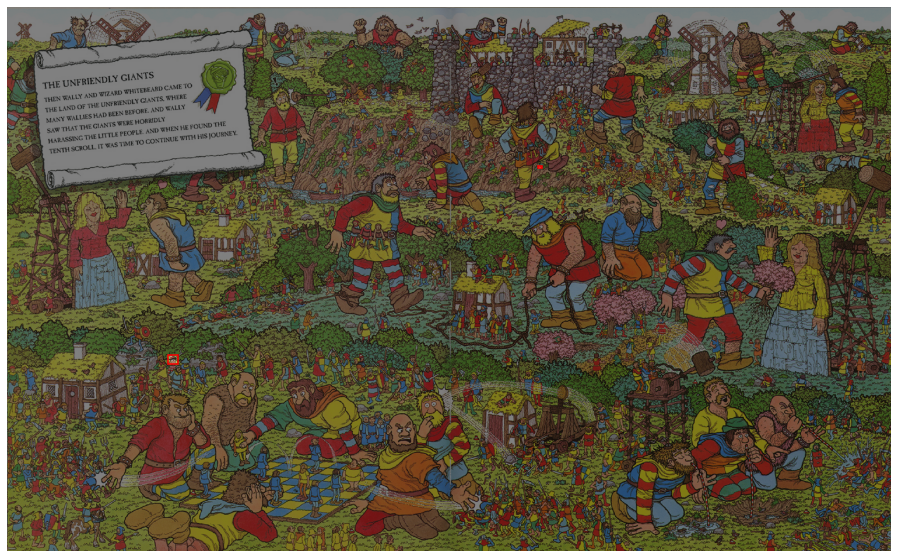

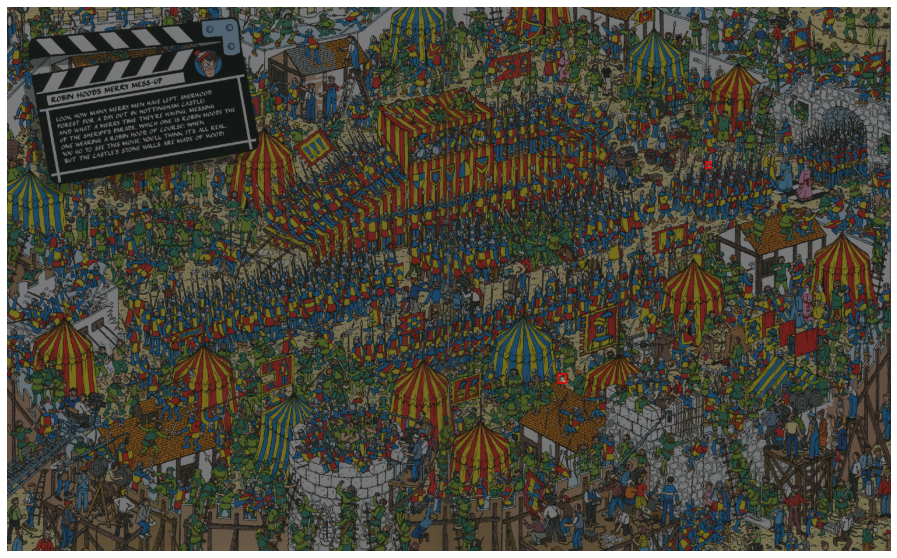

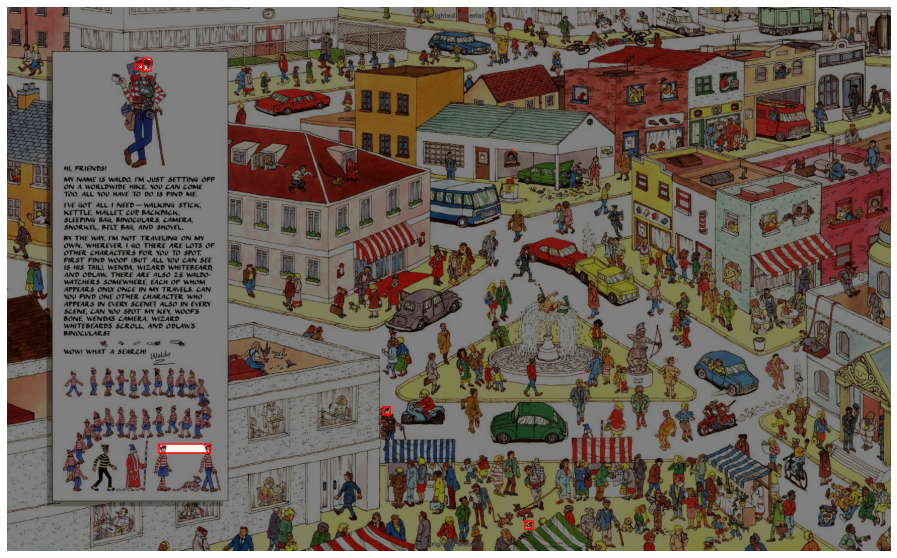

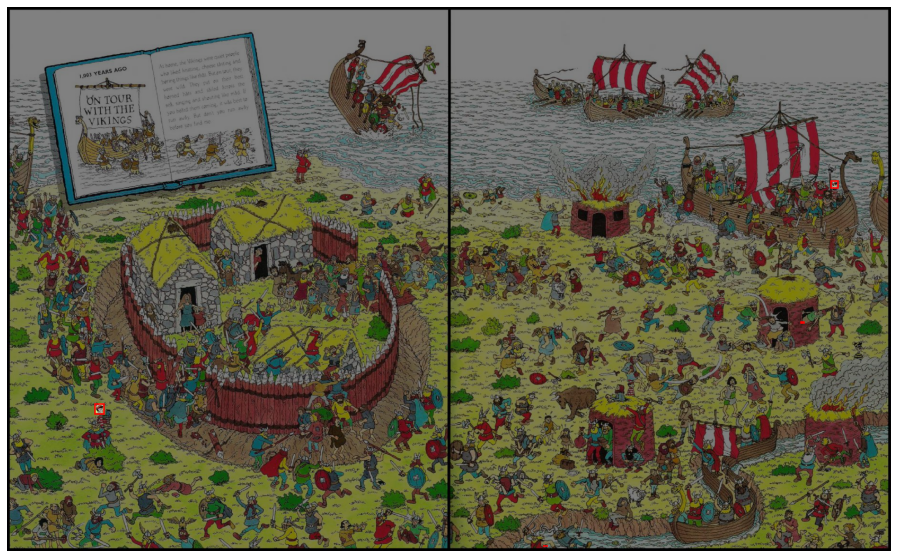

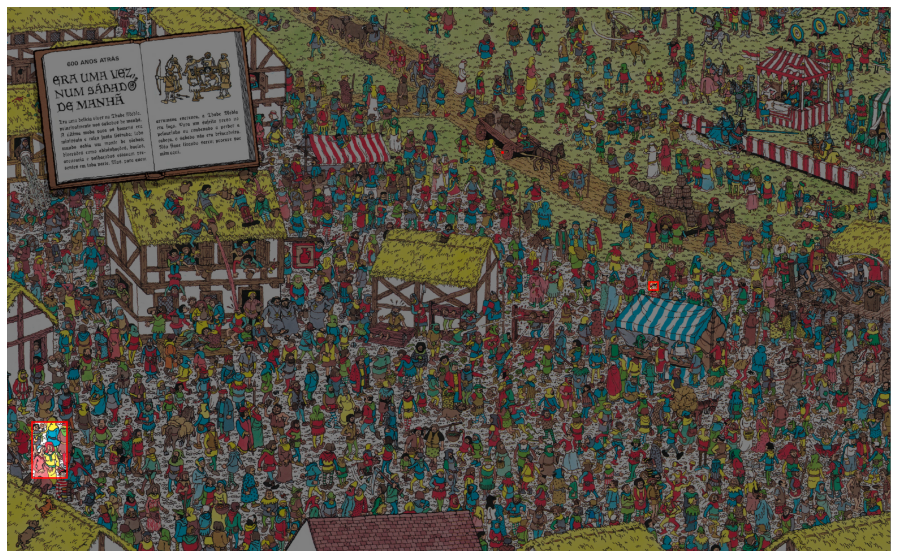

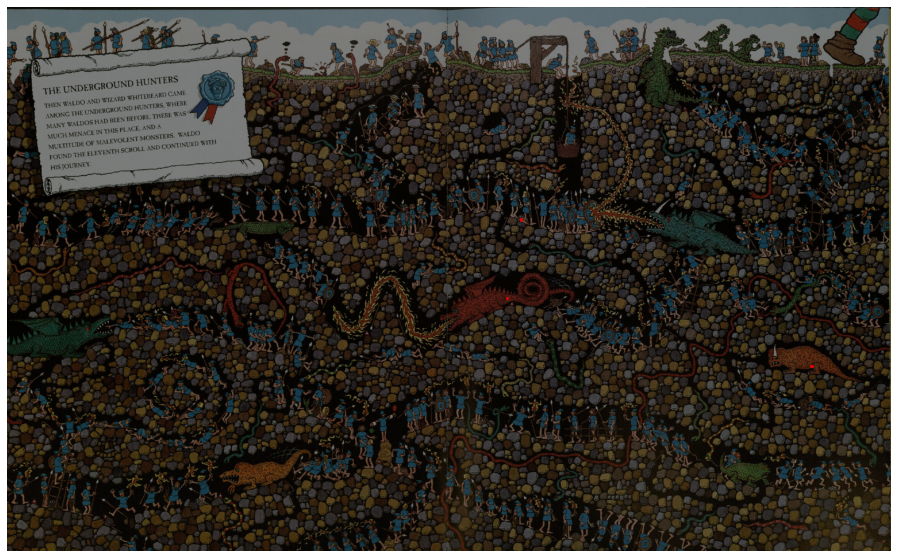

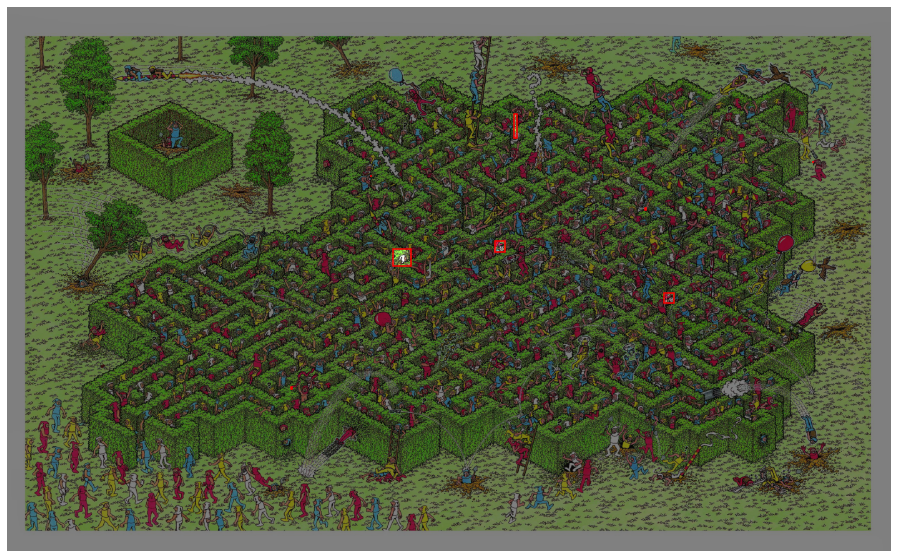

In [29]:
img_list = os.listdir('test_imgs')

for img_filename in img_list:
    test_img = np.array(Image.open(os.path.join('test_imgs', img_filename)).resize((2912, 1792), Image.NEAREST)).astype(np.float32) / 255.
    input_img  = img_crop(test_img)
    pred_output = model.predict(input_img)
    pred_output = pred_output.reshape((-1, 224, 224, 2))[:, :, :, 1]
    pred_output, overlay, rectangle = img_combine(pred_output)
    
    fig, ax = plt.subplots(figsize=(20, 10))

    ax.imshow(test_img)
    ax.imshow(overlay, alpha=0.5)

    for x1, y1, x2, y2 in rectangle:

        rect = patches.Rectangle((x1, y1), width=x2-x1, height=y2-y1, linewidth=1.5, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    ax.set_axis_off()
    
    fig.savefig(os.path.join('test_result', img_filename), bbox_inches='tight')